In [ ]:
#| default_exp core

# core

> API details.

In [ ]:
#|hide
from nbdev.showdoc import *

In [ ]:
#|export
#TODO: optimize imports
from fastai.vision.all import *

In [ ]:
data_dir = Path.home()

In [ ]:
data_dir

Path('/home/lgvaz')

TODOs:
- [x] compare original images
- [ ] resized images
- [x] augmented images
- [x] look at a single class of images (in whales, are they in the same water?)

In [ ]:
data_dir = Path(
    "/home/lgvaz/git/right-whale-recognition/notebooks/noaa-right-whale-recognition"
)
imgs_dir = data_dir / "imgs"

In [ ]:
image_files = get_image_files(data_dir / "imgs_subset")

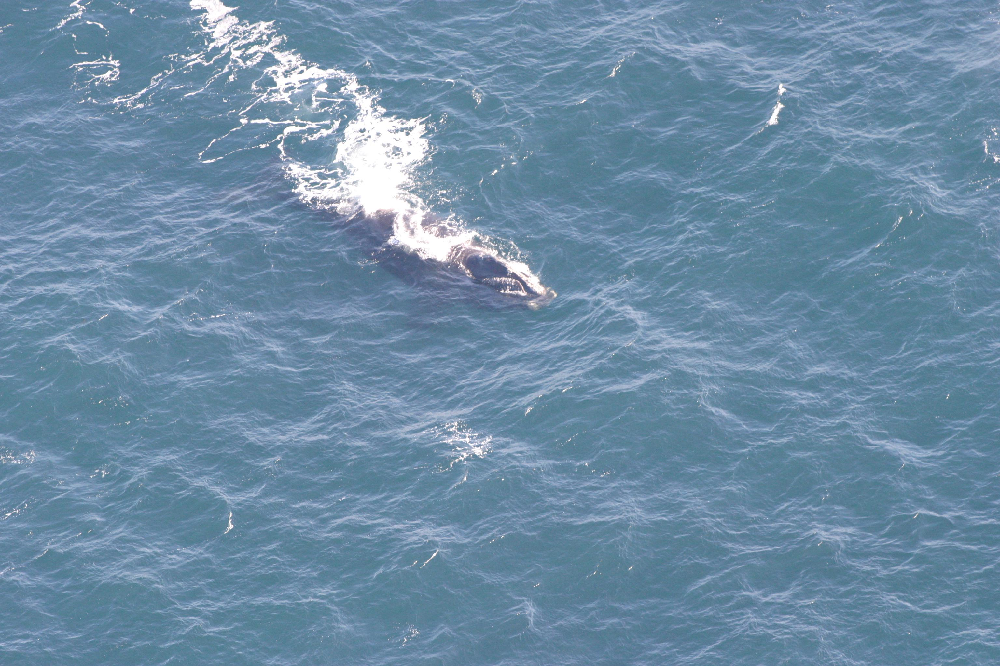

In [ ]:
image_file = image_files[0]
PILImage.create(image_file)

In [ ]:
df = pd.read_csv(data_dir / "train.csv")
# df.head()

In [ ]:
image_name2id = {r.Image: r.whaleID for r in df.itertuples()}
train_image_files = list(image_name2id.keys())


def name_to_path(image_name):
    return imgs_dir / image_name


def name_to_label(image_name):
    return image_name2id[image_name]

In [ ]:
x_pipe = [name_to_path, PILImage.create, RatioResize(500)]
y_pipe = [name_to_label, Categorize()]

x_tl = TfmdLists(train_image_files, x_pipe)
y_tl = TfmdLists(train_image_files, y_pipe)
ds = Datasets(train_image_files, [x_pipe, y_pipe])

<AxesSubplot:title={'center':'whale_48813'}>

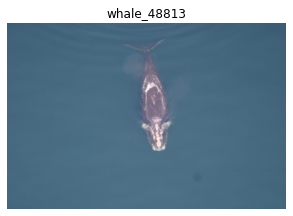

In [ ]:
ds.show(ds[0])

In [ ]:
#|export
def image_grid(
    shows: Sequence[Union[PILBase, TensorImageBase]],
    ncols=3,
    nrows=None,
    pad=0.0,
    figsize=None,
    show=True,
    xmax=None,
    ymax=None,
    **kwargs
):
    from mpl_toolkits.axes_grid1 import ImageGrid

    nrows = nrows or int(np.ceil(len(shows) / ncols))
    figsize = figsize or (14, 4 * nrows)

    fig = plt.figure(figsize=figsize)
    grid = ImageGrid(fig, 111, (nrows, ncols), axes_pad=pad, **kwargs)

    for ax, show in zip(grid, shows):
        show(ctx=ax)
        ax.set_xlim(right=xmax)
        ax.set_ylim(bottom=ymax)

    if show:
        plt.show()

    return grid

In [ ]:
#|export
def group_by_count(label_df):
    label_df["idx"] = label_df.index
#     label_df = label_df.groupby("label_id")["idx"].apply(list).reset_index()
    label_df = label_df.groupby("label_id").agg({"label": "first", "idx": list}).reset_index()
    label_df["n_samples"] = label_df.idx.str.len()
    label_df = label_df.sort_values("n_samples", ascending=False).reset_index(drop=True)
    return label_df

In [ ]:
#|export
class ClassificationExplorer:
    def __init__(self, x_tl, y_tl):
        self.x_tl = x_tl
        self.y_tl = y_tl
        
        self.id2label = y_tl.vocab
        self.label2id = {label: i for i, label in enumerate(self.id2label)}

        self.label_df = pd.DataFrame(y_tl, columns=["label_id"])
        self.label_df['label'] = self.label_df['label_id'].map(y_tl.vocab.__getitem__)
        
        self.grouped_y = group_by_count(self.label_df)

    def most_common(self):
        "Return a dataframe ordered by most common classes."
        return self.grouped_y

    def show_label_id(self, id, slice_=slice(None)):
        # TODO: can we also pick the class name to show?
        idx = self.grouped_y[self.grouped_y["label_id"] == id].index[0]
        return self.show_most_common(idx=idx, slice_=slice_)
    
    def show_label(self, label, slice_=slice(None)):
        return self.show_label_id(self.label2id[label], slice_=slice_)

    def show_most_common(self, idx: int, slice_=slice(None)):
        idxs = self.grouped_y.iloc[idx].idx
        idxs = idxs[slice_]
        
        images = [self.x_tl[i] for i in idxs]
        shows = [image.show for image in images]
        xmax, ymax = np.max([image.size for image in images], axis=0)
        
        return image_grid(shows, xmax=xmax, ymax=ymax)
    
    @classmethod
    def from_datasets(cls, dss):
        return cls(dss.tls[0], dss.tls[1])

In [ ]:
exp = ClassificationExplorer(x_tl, y_tl)

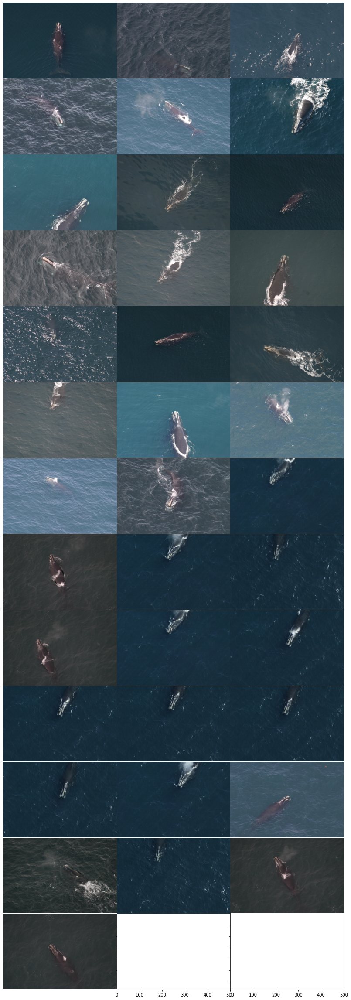

<mpl_toolkits.axes_grid1.axes_grid.ImageGrid>

In [ ]:
exp.show_label_id(426, slice_=slice(10, None))

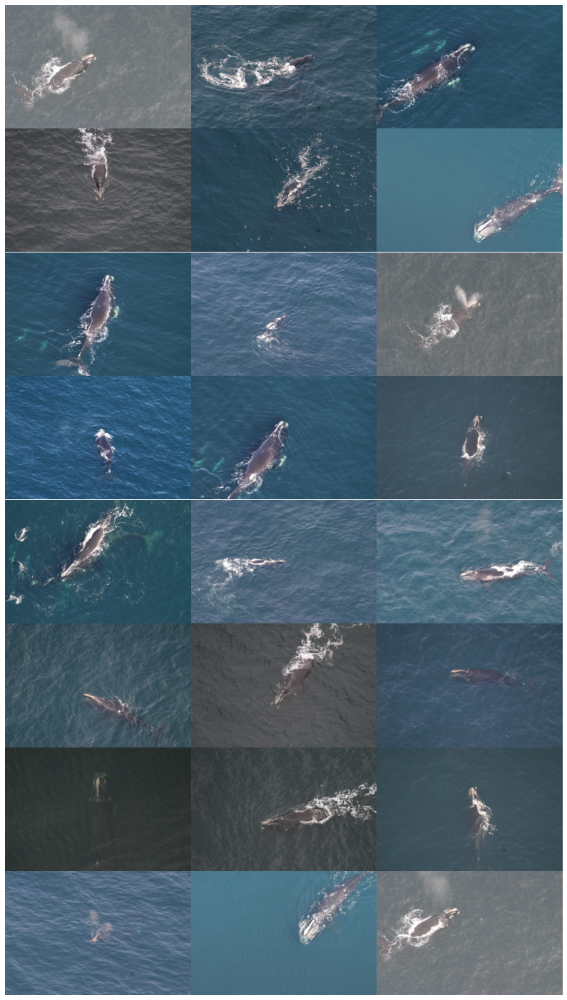

<mpl_toolkits.axes_grid1.axes_grid.ImageGrid>

In [ ]:
exp.show_most_common(12)

In [ ]:
#|export
def image_size(image_file):
    with Image.open(str(image_file)) as image:
        return image.size

In [ ]:
#|export
def image_sizes_hist(
    image_files # Sequence of image filepaths.
):
    "Plot a histogram of widths and heights."
    sizes = parallel(image_size, image_files, progress=progress_bar)
    widths, heights = zip(*sizes)
    plt.hist(widths, label='width')
    plt.hist(heights, label='heights')
    plt.legend()

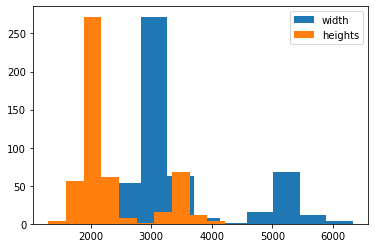

In [ ]:
image_sizes_hist(image_files)

In [ ]:
after_item = [ToTensor(), Resize(500)]
after_batch = [IntToFloatTensor(), *aug_transforms(size=300, min_scale=0.75, max_rotate=150)]
dls = ds.dataloaders(32, after_item=after_item, after_batch=after_batch, num_workers=0)

In [ ]:
#|export
def one_batch_with_idxs(
    dl, # A `DataLoader` instance. Commonly `dls.train` or `dls.valid`
    unique_idx=None, # If specified, show only images with index `unique_idx`.
):
    "Show original and transformed version of images."
    old_get_idxs = dl.get_idxs

    idxs = dl.get_idxs() if unique_idx is None else [unique_idx] * len(dl.items)
    dl.get_idxs = lambda: idxs
    x, y = dl.one_batch()

    dl.get_idxs = old_get_idxs
    
    return (x, y), idxs

In [ ]:
#|export
@delegates(image_grid)
def show_tfms(
    dl, # A `DataLoader` instance. Commonly `dls.train` or `dls.valid`
    unique_idx=None, # If specified, show only images with index `unique_idx`.
    max_n=5, # Maximum number of samples.
    ncols=2,
    pad=0.2,
    **kwargs,
):
    "Show original and transformed version of images."
    (xs, ys), idxs = one_batch_with_idxs(dl, unique_idx=unique_idx)
    
    shows = []
    xmax, ymax = 0, 0 # Has to be passed to show grid so images are not cut when displayed
    for i, x, idx in zip(range(max_n), xs, idxs):
        orig = dl.dataset[idx]
        image = orig[0]
        xmax = max(xmax, x.shape[2], image.shape[1])
        ymax = max(ymax, x.shape[1], image.shape[0])
        
        def _s(ctx, orig=orig, idx=idx):
            return dl.dataset.show(orig, ctx=show_title(idx, ctx=ctx))
        shows.append(_s)
        shows.append(x.show)
        
    return image_grid(shows, ncols=ncols, pad=pad, xmax=xmax, ymax=ymax, **kwargs)

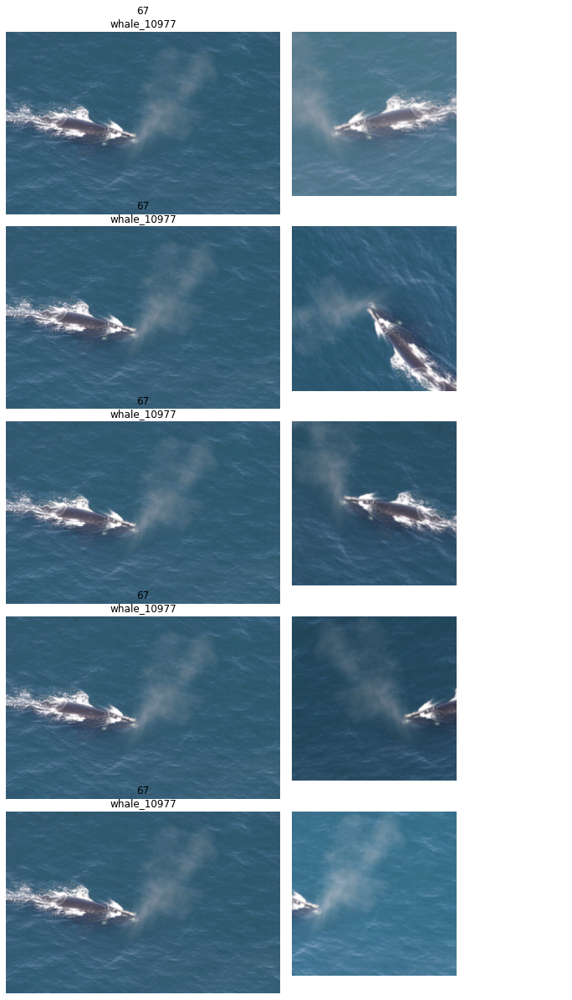

<mpl_toolkits.axes_grid1.axes_grid.ImageGrid>

In [ ]:
show_tfms(dls.train, figsize=(12, 24), unique_idx=67)

In [ ]:
#| hide
from nbdev import nbdev_export
nbdev_export()